# data

In [1]:
import geopandas as gpd
from shapely.ops import unary_union
import folium
from typing import Union
from shapely.geometry import (
    Point, LineString, MultiLineString,
    Polygon, MultiPolygon, GeometryCollection
)

import os
import geopandas as gpd

data_path = "/root/blocksnet/tests/cutter_data"

In [2]:
boundaries_gdf = gpd.read_parquet(os.path.join(data_path, "boundaries.parquet"))
crs = boundaries_gdf.estimate_utm_crs()
boundaries_gdf = boundaries_gdf.to_crs(crs)

In [3]:
blocks_gdf = gpd.read_parquet(os.path.join(data_path, "blocks.parquet")).to_crs(crs)

In [4]:

roads_gdf = gpd.read_parquet(os.path.join(data_path, "roads.parquet")).to_crs(crs)
water_gdf = gpd.read_parquet(os.path.join(data_path, "water.parquet")).to_crs(crs)
buildings_gdf = gpd.read_parquet(os.path.join(data_path, "buildings.parquet")).to_crs(crs)

In [5]:
bounds_gdf = boundaries_gdf.explode(index_parts=True).reset_index(drop=True)

In [6]:
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon, MultiPoint, MultiPolygon, LineString, MultiLineString
from shapely.ops import unary_union
from scipy.optimize import minimize
from sklearn.preprocessing import StandardScaler
from scipy.spatial import Voronoi
from sklearn.cluster import MeanShift, estimate_bandwidth
from scipy.optimize import NonlinearConstraint
from functools import partial
from sklearn.cluster import KMeans
from typing import List
from shapely.validation import make_valid
import geopandas as gpd
from IPython.display import display

# separate

In [7]:
def find_objects_within_boundary(boundary, objects_gdf):
    within_objects = gpd.sjoin(objects_gdf, 
                              gpd.GeoDataFrame(geometry=[boundary], crs="EPSG:32636"),
                              predicate='within')
    return within_objects

In [8]:
blocks_sorted = blocks_gdf.copy()
blocks_sorted['area'] = blocks_sorted.geometry.area
blocks_sorted = blocks_sorted.sort_values('area', ascending=False)

In [9]:
results_blocks = []

for idx, block in blocks_sorted.iterrows():
    boundary_geom = block.geometry
    
    buildings_in_boundary = find_objects_within_boundary(boundary_geom, buildings_gdf)
    water_in_boundary = find_objects_within_boundary(boundary_geom, water_gdf)
    roads_in_boundary = find_objects_within_boundary(boundary_geom, roads_gdf)
    # blocks_in_boundary = find_objects_within_boundary(boundary_geom, blocks_gdf)
    
    result = {
        'block_id': idx,
        'block_geometry': boundary_geom,
        'buildings': buildings_in_boundary,
        'water_objects': water_in_boundary,
        'roads': roads_in_boundary,
        # 'blocks': blocks_in_boundary
    }
    
    results_blocks.append(result)

In [10]:
len(results_blocks)

2630

In [11]:
for result in results_blocks[:10]:
    print(f"block_id: {result['block_id']}")
    print(f"Number of buildings: {len(result['buildings'])}")
    print(f"Number of water objects: {len(result['water_objects'])}")
    print(f"Number of roads: {len(result['roads'])}")
    # print(f"Number of blocks: {len(result['blocks'])}")
    print("-"*60)

block_id: 323
Number of buildings: 1342
Number of water objects: 39
Number of roads: 231
------------------------------------------------------------
block_id: 144
Number of buildings: 176
Number of water objects: 25
Number of roads: 238
------------------------------------------------------------
block_id: 294
Number of buildings: 153
Number of water objects: 8
Number of roads: 33
------------------------------------------------------------
block_id: 311
Number of buildings: 242
Number of water objects: 222
Number of roads: 62
------------------------------------------------------------
block_id: 189
Number of buildings: 341
Number of water objects: 60
Number of roads: 95
------------------------------------------------------------
block_id: 74
Number of buildings: 117
Number of water objects: 5
Number of roads: 42
------------------------------------------------------------
block_id: 150
Number of buildings: 96
Number of water objects: 56
Number of roads: 54
-------------------------

In [12]:
result = results_blocks[0]

bound_gdf = gpd.GeoDataFrame(geometry=[result['block_geometry']], crs="EPSG:32636")

m = bound_gdf.explore(
    name="Boundary", 
    color="red", 
    style_kwds={'fillOpacity': 0.1, 'weight': 3}
)
if not result['buildings'].empty:
    buildings_layer = result['buildings'].explore(
        m=m,
        name="Buildings",
        color="darkblue",
        style_kwds={'fillOpacity': 0.5},
        marker_kwds={'radius': 2} if result['buildings'].geometry.type.iloc[0] == 'Point' else None
    )


if not result['water_objects'].empty:
    water_layer = result['water_objects'].explore(
        m=m,
        name="Water",
        color="cyan",
        style_kwds={'fillOpacity': 0.7}
    )

if not result['roads'].empty:
    roads_layer = result['roads'].explore(
        m=m,
        name="Roads",
        color="black",
        style_kwds={'weight': 1.5}
    )

# if not result['blocks'].empty:
#     blocks_layer = result['blocks'].explore(
#         m=m,
#         name="Blocks",
#         color="brown",
#         style_kwds={'fillOpacity': 0.3, 'weight': 1}
#     )

folium.LayerControl().add_to(m)
display(m)

# clusters

In [13]:
result['buildings']['center'] = result['buildings'].geometry.centroid

In [14]:
# !pip install hdbscan

In [15]:
import hdbscan

In [16]:
from sklearn.cluster import DBSCAN

In [17]:
import folium
import geopandas as gpd
import numpy as np
import hdbscan
from shapely.geometry import Point
from pyproj import Transformer

# 1. Координаты зданий
coords = np.array([[point.x, point.y] for point in result['buildings'].center])

# 2. Кластеризация
clusterer = hdbscan.HDBSCAN(min_cluster_size=10, gen_min_span_tree=True)
labels = clusterer.fit_predict(coords)
result['buildings']["cluster"] = labels

n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print(f"Число найденных кластеров: {n_clusters}")

# 3. Преобразование координат в WGS84
transformer = Transformer.from_crs("EPSG:32636", "EPSG:4326", always_xy=True)
result['buildings']["lon"], result['buildings']["lat"] = zip(*[
    transformer.transform(point.x, point.y) for point in result['buildings'].center
])

# 4. Визуализация с folium
# Центр карты — среднее значение координат
map_center = [result['buildings']["lat"].mean(), result['buildings']["lon"].mean()]
m = folium.Map(location=map_center, zoom_start=13)

# Цвета кластеров
colors = plt.cm.tab20(np.linspace(0, 1, len(result['buildings']["cluster"].unique())))
color_map = {cluster: f'#{int(r*255):02x}{int(g*255):02x}{int(b*255):02x}' 
             for cluster, (r, g, b, _) in zip(result['buildings']["cluster"].unique(), colors)}

# Добавляем точки
for _, row in result['buildings'].iterrows():
    cluster = row["cluster"]
    color = "gray" if cluster == -1 else color_map[cluster]
    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=4,
        color=color,
        fill=True,
        fill_opacity=0.7,
        popup=f"Cluster: {cluster}"
    ).add_to(m)

# Отображаем карту
m


/root/blocksnet/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/root/blocksnet/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Число найденных кластеров: 15


In [18]:
import pandas as pd
from shapely import convex_hull
from shapely.ops import unary_union
from shapely import union_all
from sklearn.cluster import DBSCAN

In [19]:
clusters = result['buildings']["cluster"].unique()
convex_hulls = []

for cluster_id in clusters:
    if cluster_id == -1:
        continue 

    cluster_points = result['buildings'][result['buildings']["cluster"] == cluster_id]

    if len(cluster_points) < 2:
        continue 

    combined = cluster_points.union_all()
    hull = convex_hull(combined)

    convex_hulls.append({
        "cluster": cluster_id,
        "geometry": hull
    })


hull_gdf = gpd.GeoDataFrame(convex_hulls, crs=result['buildings'].crs)

In [20]:
hull_gdf.buffer(100).explore()

# extend lines

In [21]:
def extend_line(start_point : Point, direct_point : Point, extend_len : float):
    dx =  - direct_point.x + start_point.x
    dy =  - direct_point.y + start_point.y

    extended_point = Point(start_point.x + dx*extend_len, 
                              start_point.y + dy*extend_len)
    
    extension_line = LineString([start_point, extended_point])

    return extension_line

In [22]:
def get_first_intersection(geom, reference_line):
    if geom.is_empty:
        print('none')
        return None
        
    if geom.geom_type == "Point":
        return geom
    elif geom.geom_type == "MultiPoint":
        start_point = Point(reference_line.coords[0])
        return min(geom.geoms, key=lambda p: p.distance(start_point))
    elif geom.geom_type == "GeometryCollection":
        for item in geom.geoms:
            if item.geom_type == "Point":
                return item
            elif item.geom_type == "MultiPoint":
                start_point = Point(reference_line.coords[0])
                return min(item.geoms, key=lambda p: p.distance(start_point))
    return None

In [23]:
def extend_roads_to_boundary(
    roads: gpd.GeoDataFrame,
    boundary_geom: Polygon | MultiPolygon | LineString | MultiLineString,
    cluster_boundaries: gpd.GeoDataFrame
):
    # Глобальная граница
    if isinstance(boundary_geom, (Polygon, MultiPolygon)):
        global_boundary = boundary_geom.boundary
    elif isinstance(boundary_geom, (LineString, MultiLineString)):
        global_boundary = boundary_geom
    else:
        raise TypeError("boundary_geom should be Polygon / MultiPolygon or LineString / MultiLineString")

    # Получаем границы всех кластеров как GeoSeries
    cluster_boundary_series = cluster_boundaries.boundary
    global_boundary_series = gpd.GeoSeries([global_boundary], crs=roads.crs)

    # Объединяем все границы через union_all
    combined_boundary_series = pd.concat([global_boundary_series, cluster_boundary_series])
    combined_boundary = combined_boundary_series.union_all()

    extend_len = boundary_geom.length * 1000
    extended_lines = []

    for idx, road in roads.geometry.items():
        coords = list(road.coords)
        if len(coords) < 2:
            continue

        start_point = Point(coords[0])
        start_direct_point = Point(coords[1])
        end_point = Point(coords[-1])
        end_direct_point = Point(coords[-2])

        start_line = extend_line(start_point, start_direct_point, extend_len)
        end_line = extend_line(end_point, end_direct_point, extend_len)

        # Пересечения с объединённой границей
        start_boundary_intersect = get_first_intersection(
            start_line.intersection(combined_boundary),
            start_line
        )
        end_boundary_intersect = get_first_intersection(
            end_line.intersection(combined_boundary),
            end_line
        )

        # Исключаем текущую дорогу
        other_roads = roads.drop(idx)
        other_roads_union = other_roads.union_all()

        start_roads_intersect = get_first_intersection(
            start_line.intersection(other_roads_union),
            start_line
        )
        end_roads_intersect = get_first_intersection(
            end_line.intersection(other_roads_union),
            end_line
        )

        def nearest_point(p1, p2, ref_point):
            if p1 and p2:
                return p1 if ref_point.distance(p1) < ref_point.distance(p2) else p2
            return p1 or p2

        final_start = nearest_point(start_boundary_intersect, start_roads_intersect, start_point)
        final_end = nearest_point(end_boundary_intersect, end_roads_intersect, end_point)

        if final_start:
            extended_lines.append(LineString([start_point, final_start]))
        if final_end:
            extended_lines.append(LineString([end_point, final_end]))

    return gpd.GeoDataFrame(geometry=extended_lines, crs=roads.crs)


In [24]:
roads_copy = result['roads'].copy()
new_roads = extend_roads_to_boundary(roads_copy, result['block_geometry'], cluster_boundaries=hull_gdf )
new_roads

none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none
none


,geometry
0,"LINESTRING (377656.175 6646447.29, 377656.175 ..."
1,"LINESTRING (377582.036 6646627.337, 377562.485..."
2,"LINESTRING (377656.175 6646447.29, 377656.175 ..."
3,"LINESTRING (377753.842 6646307.458, 377753.842..."
4,"LINESTRING (379318.547 6643432.361, 379318.547..."
...,...
457,"LINESTRING (371987.585 6646526.132, 371987.585..."
458,"LINESTRING (372010.383 6646138.202, 372010.383..."
459,"LINESTRING (372055.27 6646099.69, 372055.27 66..."
460,"LINESTRING (371163.683 6647805.165, 371163.683..."


In [25]:
new_roads.explore()

In [26]:

bound_gdf = gpd.GeoDataFrame(geometry=[result['block_geometry']], crs="EPSG:32636")

m = bound_gdf.explore(
    name="Boundary", 
    color="black", 
    style_kwds={'fillOpacity': 0.0, 'weight': 3}
)

if not result['roads'].empty:
    roads_layer = result['roads'].explore(
        m=m,
        name="Roads",
        color="red",
        style_kwds={'weight': 1.5}
    )

if not result['buildings'].empty:
    build_layer = result['buildings'].explore(
        m=m,
        name="Buildings",
        color="darkblue",
        style_kwds={'weight': 1.5}
    )

if not new_roads.empty:
    ext_roads_layer = new_roads.explore(
        m=m, 
        name="Roads",
        color="lightgreen", 
        style_kwds={'weight': 1.5}
    )

if not hull_gdf.empty:
    ext_roads_layer = hull_gdf.explore(
        m=m, 
        name="Clusters",
        color="lightgreen", 
        style_kwds={'weight': 1.5}
    )


folium.LayerControl().add_to(m)
display(m)

## inter build

In [27]:
from shapely.ops import split
from shapely import ops
import pandas as pd

In [28]:
def get_inters_buildings(line : LineString, 
                         build_gdf : gpd.GeoDataFrame):

    build_gdf_exploded = build_gdf.explode(index_parts=False)
    build_gdf_exploded['intersects'] = build_gdf_exploded.geometry.intersects(line)
    intersected = build_gdf_exploded[build_gdf_exploded['intersects']].drop(columns=['intersects'])
    non_intersected = build_gdf_exploded[~build_gdf_exploded['intersects']].drop(columns=['intersects'])

    return intersected, non_intersected


In [29]:
def line_around_polygon (line : LineString, 
                         polygon : Polygon):
    
    inner_part = line.intersection(polygon)
    outer_parts = line.difference(polygon)

    if outer_parts.is_empty:
        return LineString()
    
    coords = []
    if isinstance(inner_part, LineString):
        coords = list(inner_part.coords)
    elif isinstance(inner_part, MultiLineString):
        if inner_part.geoms:
            coords = list(inner_part.geoms[0].coords) + list(inner_part.geoms[-1].coords)

    if len(coords) < 2:
        return line
    
    start_point = Point(coords[0])
    end_point = Point(coords[-1])

    boundary = polygon.exterior

    start_on_boundary = boundary.interpolate(boundary.project(start_point))
    end_on_boundary = boundary.interpolate(boundary.project(end_point))

    try:
        subpath = ops.substring(
            boundary,
            boundary.project(start_on_boundary),
            boundary.project(end_on_boundary),
            normalized=False
        )
    except ValueError:
        return line
    
    new_line_parts = []

    if outer_parts.geom_type == 'MultiLineString':
        for part in outer_parts.geoms:
            new_line_parts.append(part)
    else:
        new_line_parts.append(outer_parts)

    new_line_parts.append(subpath)

    result_line = ops.linemerge(new_line_parts)

    return result_line if not result_line.is_empty else line

In [30]:
def min_distance_to_buildings(inters_gdf : gpd.GeoDataFrame, 
                              non_inters_gdf : gpd.GeoDataFrame, 
                              buffer_dist : float = 20):
    results = []
    non_inters_gdf = non_inters_gdf.explode(index_parts=False)

    for idx, inters_row in inters_gdf.iterrows():
        inters_geom = inters_row.geometry

        buffer = inters_geom.buffer(buffer_dist)
        
        nearby_buildings = non_inters_gdf[
            (non_inters_gdf.intersects(buffer)) |
            (non_inters_gdf.distance(buffer) < 1e-6)
        ]
        print("nearby builds", len(nearby_buildings))


        if nearby_buildings.empty:
            continue
        
        distances = nearby_buildings.distance(inters_geom)
        min_dist = distances.min()
        results.append(min_dist)
    
    
    if len(results) == 0:
        return buffer_dist
    
    return min(results)

In [31]:
def new_borderline(line : LineString, 
                   build_gdf : gpd.GeoDataFrame):
    
    inters_build_gdf, non_inters_builds = get_inters_buildings(line, build_gdf[['geometry']])
    buffer_distance = min_distance_to_buildings(inters_build_gdf, non_inters_builds)
    # buffer_distance = 20

    
    inters_build_gdf['buffer_geometry'] = inters_build_gdf.apply(
        lambda row: row.geometry.buffer(
            distance=buffer_distance,
            quad_segs=2
        ),
        axis=1
    )

    multy = unary_union(inters_build_gdf['buffer_geometry'])
    try:
        list_pols = list(multy.geoms)
    except:
        list_pols = [multy]

    modified_border_line = line

    for pol in list_pols:
        modified_border_line = line_around_polygon(modified_border_line, pol)
    
    return modified_border_line

In [32]:
# Создаем копию GeoDataFrame или новый столбец для результатов, если нужно
new_roads['new_geometry'] = new_roads['geometry']  # Временный столбец для хранения результатов

# Применение функции с использованием iterrows
for idx, row in new_roads.iterrows():
    geom = row['geometry']
    if geom is None or geom.is_empty:
        new_roads.at[idx, 'new_geometry'] = geom  # Сохраняем пустую геометрию
    else:
        new_roads.at[idx, 'new_geometry'] = new_borderline(geom, result['buildings'])

# Перемещаем результаты в столбец geometry, если нужно
new_roads['geometry'] = new_roads['new_geometry']
new_roads = new_roads.drop(columns=['new_geometry'])  # Удаляем временный столбец

# Проверка пустых геометрий после обработки
print("Пустые геометрии после обработки:")
print(new_roads[new_roads['geometry'].is_empty])

nearby builds 1
nearby builds 1
nearby builds 0
nearby builds 2
nearby builds 2
nearby builds 1
nearby builds 1
nearby builds 1
nearby builds 0
nearby builds 0
nearby builds 1
nearby builds 0
nearby builds 0
nearby builds 0
nearby builds 2
nearby builds 0
nearby builds 2
nearby builds 0
nearby builds 3
nearby builds 0
nearby builds 0
nearby builds 1
nearby builds 1
nearby builds 1
nearby builds 1
nearby builds 2
nearby builds 3
nearby builds 0
nearby builds 0
nearby builds 1
nearby builds 3
nearby builds 1
nearby builds 0
nearby builds 1
nearby builds 1
Пустые геометрии после обработки:
             geometry
311  LINESTRING EMPTY


In [33]:
new_roads

,geometry
0,"LINESTRING (377656.175 6646447.29, 377656.175 ..."
1,"LINESTRING (377582.036 6646627.337, 377562.485..."
2,"LINESTRING (377656.175 6646447.29, 377656.175 ..."
3,"LINESTRING (377753.842 6646307.458, 377753.842..."
4,"LINESTRING (379318.547 6643432.361, 379318.547..."
...,...
457,"LINESTRING (371987.585 6646526.132, 371987.585..."
458,"LINESTRING (372010.383 6646138.202, 372010.383..."
459,"LINESTRING (372055.27 6646099.69, 372055.27 66..."
460,"LINESTRING (371163.683 6647805.165, 371163.683..."


# classifier

In [34]:
all_roads = gpd.GeoDataFrame(pd.concat([new_roads, roads_copy], ignore_index=True), crs=roads_copy.crs)

In [35]:
# Извлекаем границы полигонов как LineString
polygon_boundaries = hull_gdf.boundary

# Создаем GeoDataFrame с границами полигонов
boundaries_gdf = gpd.GeoDataFrame(geometry=polygon_boundaries)

# Объединяем GeoDataFrame с линиями и границами полигонов
new_roads = gpd.GeoDataFrame(pd.concat([new_roads, boundaries_gdf, result['roads']], ignore_index=True))

# Сбрасываем индекс, если нужно
new_roads = new_roads.reset_index(drop=True)

In [46]:
from blocksnet.blocks.cutting import preprocess_urban_objects

lines_gdf, polygons_gdf = preprocess_urban_objects(new_roads, None, result['water_objects'])

2025-06-04 14:19:49.532 | INFO     | blocksnet.blocks.cutting.preprocessing.core:preprocess_urban_objects:44 - Checking roads schema
2025-06-04 14:19:49.541 | INFO     | blocksnet.blocks.cutting.preprocessing.core:preprocess_urban_objects:51 - Checking railways schema
2025-06-04 14:19:49.542 | WARNING  | blocksnet.blocks.cutting.preprocessing.core:preprocess_urban_objects:53 - Railways GeoDataFrame is None. Creating empty
2025-06-04 14:19:49.544 | INFO     | blocksnet.blocks.cutting.preprocessing.core:preprocess_urban_objects:58 - Checking water schema


In [73]:
from blocksnet.blocks.cutting import _exclude_polygons, _get_enclosures, _fill_holes, _filter_overlapping

boundaries_gdf = _exclude_polygons(bound_gdf, polygons_gdf)

2025-06-04 14:52:08.982 | INFO     | blocksnet.blocks.cutting.processing.core:_exclude_polygons:45 - Excluding polygon objects from blocks


In [74]:
blocks_gdf = _get_enclosures(boundaries_gdf, lines_gdf)


2025-06-04 14:52:11.091 | INFO     | blocksnet.blocks.cutting.processing.core:_get_enclosures:51 - Setting up enclosures


In [76]:
blocks_gdf = _fill_holes(blocks_gdf)

2025-06-04 14:52:33.181 | INFO     | blocksnet.blocks.cutting.processing.core:_fill_holes:68 - Filling holes inside the blocks


In [68]:
from blocksnet.blocks.cutting import cut_urban_blocks
    
blocks_res = cut_urban_blocks(boundaries_gdf=bound_gdf, lines_gdf=lines_gdf, polygons_gdf=polygons_gdf, fill_holes=False)

2025-06-04 14:28:23.653 | INFO     | blocksnet.blocks.cutting.processing.core:wrapper:21 - Checking boundaries schema
2025-06-04 14:28:23.668 | INFO     | blocksnet.blocks.cutting.processing.core:wrapper:25 - Checking line objects schema
2025-06-04 14:28:23.684 | INFO     | blocksnet.blocks.cutting.processing.core:wrapper:31 - Checking polygon objects schema
2025-06-04 14:28:23.698 | INFO     | blocksnet.blocks.cutting.processing.core:_exclude_polygons:45 - Excluding polygon objects from blocks
2025-06-04 14:28:23.720 | INFO     | blocksnet.blocks.cutting.processing.core:_get_enclosures:51 - Setting up enclosures
2025-06-04 14:28:23.754 | INFO     | blocksnet.blocks.cutting.processing.core:_filter_overlapping:78 - Filtering overlapping geometries
2025-06-04 14:28:23.777 | SUCCESS  | blocksnet.blocks.cutting.processing.core:cut_urban_blocks:118 - Blocks are successfully cut!


In [77]:
blocks_gdf.explore()

In [42]:
from blocksnet.machine_learning.classification import BlocksClassifier

classifier = BlocksClassifier()
res = classifier.evaluate(blocks_res)

2025-06-04 14:18:24.671 | INFO     | blocksnet.preprocessing.feature_engineering.core:_calculate_usual_features:35 - Calculating usual features
2025-06-04 14:18:24.680 | INFO     | blocksnet.preprocessing.feature_engineering.core:_calculate_aspect_ratios:58 - Calculating aspect ratios
100%|██████████| 208/208 [00:00<00:00, 23674.77it/s]
2025-06-04 14:18:24.695 | INFO     | blocksnet.preprocessing.feature_engineering.core:_calculate_centerlines:21 - Calculating centerlines
100%|██████████| 208/208 [00:00<00:00, 283.35it/s]
2025-06-04 14:18:25.448 | INFO     | blocksnet.preprocessing.feature_engineering.core:_generate_combinations:68 - Generating combinations


In [43]:
blocks_gdf_classified = classifier.evaluate(blocks_res)
blocks_gdf_classified['geometry'] = blocks_res.geometry
blocks_gdf_classified = gpd.GeoDataFrame(blocks_gdf_classified, geometry=blocks_gdf_classified.geometry, crs=blocks_res.crs)

2025-06-04 14:18:25.897 | INFO     | blocksnet.preprocessing.feature_engineering.core:_calculate_usual_features:35 - Calculating usual features
2025-06-04 14:18:25.906 | INFO     | blocksnet.preprocessing.feature_engineering.core:_calculate_aspect_ratios:58 - Calculating aspect ratios
100%|██████████| 208/208 [00:00<00:00, 21531.55it/s]
2025-06-04 14:18:25.919 | INFO     | blocksnet.preprocessing.feature_engineering.core:_calculate_centerlines:21 - Calculating centerlines
100%|██████████| 208/208 [00:00<00:00, 279.14it/s]
2025-06-04 14:18:26.668 | INFO     | blocksnet.preprocessing.feature_engineering.core:_generate_combinations:68 - Generating combinations


In [44]:
blocks_gdf_classified.explore(
    column="category",
    cmap=["red", "yellow", "green"],
    categories=["BlockCategory.INVALID", "BlockCategory.LARGE", "BlockCategory.NORMAL"],
    legend=True,
    tooltip=["category", "probability"],
    popup=True,
    zoom_start=18
)

In [45]:
res_gdf = gpd.GeoDataFrame(res, geometry=res.geometry, crs=blocks_res.crs)

AttributeError: 'DataFrame' object has no attribute 'geometry'

In [ ]:
res_gdf.explore(
    column="category",       # столбец с категориями
    cmap=["red", "yellow", "green"],  # цвета для категорий: INVALID, LARGE, NORMAL
    categories=["BlockCategory.INVALID", "BlockCategory.LARGE", "BlockCategory.NORMAL"],
    legend=True,
    tooltip=["category", "probability"],  # какие поля показывать при наведении
    popup=True,
    zoom_start=18
)

In [ ]:
import folium
from folium.plugins import HeatMap
import geopandas as gpd

# Убедимся, что данные в WGS84 (EPSG:4326) — долготы и широты
# all_roads_wgs84 = all_roads.to_crs(epsg=4326)

points = []
for _, row in all_roads.iterrows():
    geom = row.geometry
    if geom.geom_type == 'LineString':
        coords = list(geom.coords)
        points.extend([[y, x] for x, y in coords])  
    elif geom.geom_type == 'MultiLineString':
        for line in geom.geoms:
            coords = list(line.coords)
            points.extend([[y, x] for x, y in coords])

centroid = all_roads.geometry.centroid.iloc[0]
m = folium.Map(location=[centroid.y, centroid.x], zoom_start=14)

HeatMap(
    data=points,
    radius=15,
    blur=20,
    max_zoom=18,
    gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 1: 'red'}  
).add_to(m)

m

C:\Users\yanaz\AppData\Local\Temp\ipykernel_1400\840883656.py:22: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = all_roads.geometry.centroid.iloc[0]


C:\Users\yanaz\AppData\Local\Temp\ipykernel_1400\3683534133.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.hexbin(all_roads.geometry.centroid.x, all_roads.geometry.centroid.y, gridsize=50, cmap='OrRd')


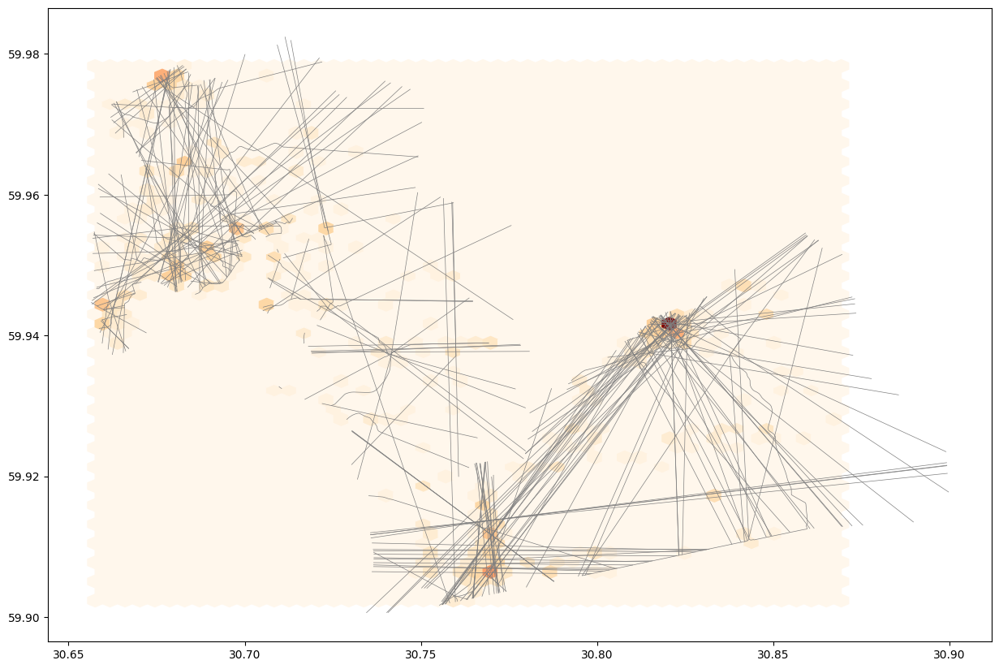

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(15, 15))
all_roads.plot(ax=ax, color='gray', linewidth=0.5)
ax.hexbin(all_roads.geometry.centroid.x, all_roads.geometry.centroid.y, gridsize=50, cmap='OrRd')
plt.show()

# Combining invalid blocks

In [ ]:
blocks_gdf_classified

,invalid,large,normal,category,probability,geometry
0,0.096013,0.000545,0.903442,BlockCategory.NORMAL,0.903442,"POLYGON ((377582.036 6646627.337, 377562.485 6..."
1,0.015717,0.000166,0.984118,BlockCategory.NORMAL,0.984118,"POLYGON ((377562.485 6646681.657, 377582.036 6..."
2,0.000849,0.963715,0.035437,BlockCategory.LARGE,0.963715,"POLYGON ((377118.248 6643051.531, 376720.454 6..."
3,0.419097,0.000436,0.580467,BlockCategory.NORMAL,0.580467,"POLYGON ((376720.454 6642981.878, 377118.248 6..."
4,0.233170,0.000021,0.766808,BlockCategory.NORMAL,0.766808,"POLYGON ((374709.288 6646592.098, 374709.11 66..."
...,...,...,...,...,...,...
203,0.004781,0.000016,0.995203,BlockCategory.NORMAL,0.995203,"POLYGON ((378290.033 6646754.126, 378318.936 6..."
204,0.095475,0.000051,0.904474,BlockCategory.NORMAL,0.904474,"POLYGON ((378335.32 6646777.867, 378318.936 66..."
205,0.080900,0.000039,0.919061,BlockCategory.NORMAL,0.919061,"POLYGON ((378335.32 6646777.867, 378292.285 66..."
206,0.047357,0.000018,0.952625,BlockCategory.NORMAL,0.952625,"POLYGON ((378408.361 6646687.097, 378335.32 66..."


In [ ]:
import geopandas as gpd
from shapely.geometry import LineString, MultiLineString
from shapely.ops import unary_union
from blocksnet.machine_learning.classification import BlockCategory


def merge_invalid_blocks(gdf: gpd.GeoDataFrame) -> gpd.GeoDataFrame:
    gdf = gdf.copy()

    while True:
        valid_mask = gdf["category"].isin([BlockCategory.NORMAL, BlockCategory.LARGE])
        invalid_mask = gdf["category"] == BlockCategory.INVALID

        merge_candidates = gdf[invalid_mask]
        valid_blocks = gdf[valid_mask]

        if merge_candidates.empty:
            break

        merged_any = False

        for idx, row in merge_candidates.iterrows():
            if idx not in gdf.index:
                continue

            target_geom = row.geometry
            max_shared_length = 0
            matched_idx = None

            for valid_idx, valid_row in valid_blocks.iterrows():
                if valid_idx not in gdf.index or idx == valid_idx:
                    continue

                valid_geom = valid_row.geometry
                if not target_geom.intersects(valid_geom):
                    continue

                intersection = target_geom.intersection(valid_geom)

                if isinstance(intersection, LineString):
                    shared_length = intersection.length
                elif isinstance(intersection, MultiLineString):
                    shared_length = sum(line.length for line in intersection.geoms)
                else:
                    shared_length = 0

                if shared_length > max_shared_length:
                    max_shared_length = shared_length
                    matched_idx = valid_idx

            if matched_idx is not None:
                new_geom = unary_union([target_geom, gdf.at[matched_idx, 'geometry']])
                gdf.at[matched_idx, 'geometry'] = new_geom
                gdf = gdf.drop(index=idx)
                merged_any = True
                break

        if not merged_any:
            break

    return gdf.reset_index(drop=True)


def merge_empty_blocks(gdf: gpd.GeoDataFrame, buildings: gpd.GeoDataFrame) -> gpd.GeoDataFrame:
    gdf = gdf.copy()

    # Добавляем колонку с информацией о наличии зданий
    gdf["has_buildings"] = gdf.geometry.apply(
        lambda geom: not buildings[buildings.intersects(geom)].empty
    )

    while True:
        # Пустые кварталы, исключая INVALID
        empty_mask = ~gdf["has_buildings"] & (gdf["category"] != BlockCategory.INVALID)
        empty_blocks = gdf[empty_mask]

        if empty_blocks.empty:
            break

        merged_any = False

        for idx, row in empty_blocks.iterrows():
            if idx not in gdf.index:
                continue

            target_geom = row.geometry
            max_shared_length = 0
            matched_idx = None

            for other_idx, other_row in empty_blocks.iterrows():
                if other_idx == idx or other_idx not in gdf.index:
                    continue

                other_geom = other_row.geometry
                if not target_geom.intersects(other_geom):
                    continue

                intersection = target_geom.intersection(other_geom)

                if isinstance(intersection, LineString):
                    shared_length = intersection.length
                elif isinstance(intersection, MultiLineString):
                    shared_length = sum(line.length for line in intersection.geoms)
                else:
                    shared_length = 0

                if shared_length > max_shared_length:
                    max_shared_length = shared_length
                    matched_idx = other_idx

            if matched_idx is not None and matched_idx in gdf.index:
                new_geom = unary_union([target_geom, gdf.at[matched_idx, 'geometry']])
                gdf.at[matched_idx, 'geometry'] = new_geom
                gdf = gdf.drop(index=idx)
                merged_any = True
                break  # пересчитать маски после объединения

        if not merged_any:
            break

    return gdf.drop(columns="has_buildings").reset_index(drop=True)


In [ ]:
combined_gdf = merge_invalid_blocks(blocks_gdf_classified)
combined_gdf = merge_empty_blocks(combined_gdf, result["buildings"])


In [ ]:
combined_gdf.explore(
    column="category",
    cmap=["red", "yellow", "green"],
    categories=["BlockCategory.INVALID", "BlockCategory.LARGE", "BlockCategory.NORMAL"],
    legend=True,
    tooltip=["category", "probability"],
    popup=True,
    zoom_start=12
)